## EA614 2020.1
____
##### Aluno: Marcos Diaz 
##### RA: 221525

#### Preparação

In [77]:
from espectro import espectro
from kaiser import kaiser

import scipy.io
from scipy.io import wavfile
from scipy.signal import convolve

import IPython.display as ipd

import math
import numpy as np
import matplotlib.pyplot as plt

#### (a) Leitura do arquivo de áudio

In [78]:
Fs, y = wavfile.read("queen_I_want_it_all.wav")
y=y[:,0]+y[:,1]

In [79]:
# frequência de amostragem original da música
Fs

44100

#### (b) Espectro do sinal original

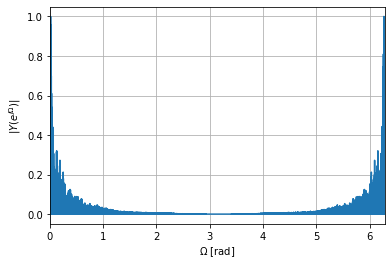

In [80]:
Y = espectro(y)

**Comentário sobre a escala**

A escala horizontal do gráfico apresenta a frequência "normalizada", ou seja, a frequência angular dividida pela frequência de corte.
Como sabemos a frequência de corte, podemos interpretar os valores de (omega grande) como frequências simples (em Hz) utilizando a equação:
(omega_grande*fs/2pi)

In [81]:
freq_simp = lambda omega: omega*Fs/(2*np.pi)

In [82]:
freq_simp(1)

7018.732990352584

In [83]:
freq_simp(2)

14037.465980705168

**Discussão**

O conteúdo espectral do sinal de áudio se concentra principalmente até a frequência de 2 radianos ou aproximadamente 14,037kHz, de modo que é possível considerar essa como a frequência máxima do sinal.
Outro aspecto que se destaca é a concentração de sinais de maior amplitude em baixas frequências: a maior parte da energia do espectro encontra-se até 1 radiano ou aproximadamente 7,018kHz.
Por fim, como esperado do espectro de um sinal amostrado, observa-se a réplica espectral centrada na frequência 2pi radianos.

Observando atentamente o espectro, as altas frequências, ainda que relativamente muito fracas, não são nulas; assim, é esperado aliasing próximo da frequẽncia de 3 radianos. No entanto, podemos definir a frequência máxima como dito acima, ou seja, para nossos propósitos, considerar o sinal como limitado em banda. Como a frequência de amostragem é aproximadamente o triplo da máxima, pelo Teorema da Amostragem o sinal não sofre aliasing.

#### (c) Subamostragem

In [126]:
# fator de decimação
M = 6

In [127]:
y_decimated = [y[M*i] for i in range(math.ceil(len(y)/M)) if i <len(y)]

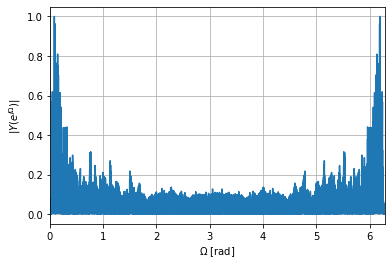

In [128]:
Y_decimated = espectro(y_decimated)

In [110]:
# nova frequência de amostragem
Fs/M

4410.0

**Discussão**

O espectro do sinal subamostrado mantém o predomínio das baixas frequências (até 2 radianos); no entanto, é visível o aumento relativo das amplitudes em frequências mais altas - a energia do sinal é melhor disribuída entre as frequências. Tal comportamento é fruto de aliasing: o sinal e sua réplica se sobrepõem, gerando a deformação observada principalmente na faixa de 1 a 6 radianos.
Aliasing considerável era esperado na nova amostragem: considerando a frequência máxima como 2 radianos, a nova frequência de amostragem é aproximadamente a metade da máxima, de modo que não vale o teorema da amostragem. 

#### (d) Comparação auditiva

**Original**

In [88]:
ipd.Audio(y,rate=Fs)

**Subamostrado**

In [89]:
ipd.Audio(y_decimated,rate=Fs/M)

**Discussão**

Comparado ao original, o áudio do sinal subamostrado parece ser abafado como um todo. Percebe-se o que parece ser uma menor separação entre os instrumentos: a música parece mais homogênea. Nota-se, em geral, a perda da clareza de sons agudos, previsível, já que a maior parte do aliasing ocorre em frequências mais altas.

#### (e) Filtros Anti-Aliasing

In [90]:
h_1 = kaiser(0.45,2)
h_2 = kaiser(0.45,0.5)
h_3 = kaiser(1.5,2)

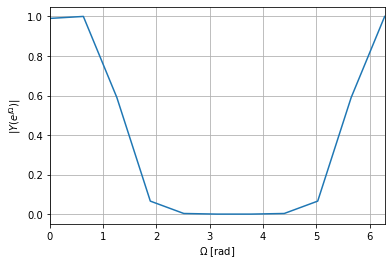

In [91]:
H_1 = espectro(h_1)

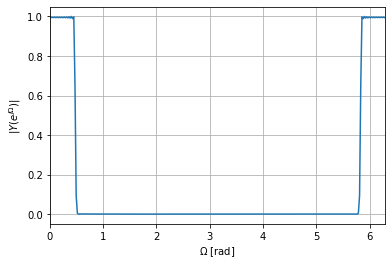

In [92]:
H_2 = espectro(h_2)

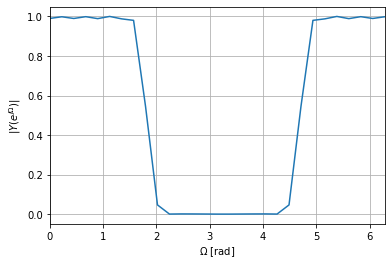

In [93]:
H_3 = espectro(h_3)

**Discussão**

Os filtros se diferenciam, principalmente, por suas diferentes faixas de de rejeição: o segundo tem a maior delas, seguido do primeiro e do terceiro. Eles também diferem quanto a transição entre a faixa de passagem e rejeição: o primeiro apresenta uma faixa de transição maior, esperado devido à diferença de 1,55 rad entre sua frequência de corte e de rejeição; o segundo tem uma transição quase instantânea e o terceiro uma transição intermediária.

#### (f) Filtragem do sinal original

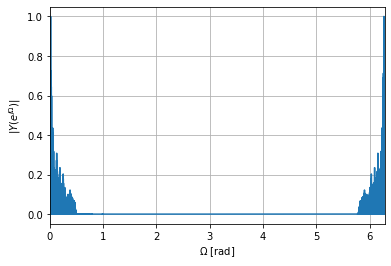

In [94]:
y_filtered = scipy.signal.convolve(y, h_2, mode='full')
Y_filtered = espectro(y_filtered)

In [95]:
ipd.Audio(y_filtered,rate=Fs)

**Discussão**

O espectro obtido é o esperado de um sinal filtrado por um filtro passa-baixas próximo do ideal: as frequências a partir de 0,5 radianos foram anuladas, de modo que as próximas frequências não nulas são as da réplica da banda base.

No áudio é perceptível a falta das frequências mais altas, gerando um efeito abafado, principalmente no coro inicial da música. Também há uma sensação de volume mais baixo, fruto da menor energia do espectro quando comparado ao original. Todos esses efeitos são esperados dada a filtragem, que omite frequências maiores que 0,5 radianos.

#### (g) Subamostragem do sinal filtrado 

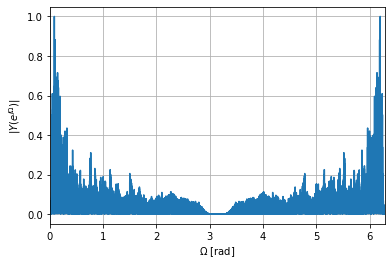

In [96]:
y_filtered_decimated = [y_filtered[M*i] for i in range(math.ceil(len(y_filtered)/M)) if i <len(y_filtered)]
Y_filtered_decimated = espectro(y_filtered_decimated)

In [97]:
ipd.Audio(y_filtered_decimated,rate=Fs/M)

In [131]:
# razão entre a frequência de amostragem e a máxima
(Fs/M)/freq_simp(0.5)

2.0943951023931957

**Discussão**

Comparando o espectro do sinal submastrado com o do sinal filtrado e subamostrado, verificamos que são similares em fomra até uma região aproximadamente entre 3 e 3,5 radianos, na qual o filtrado e subamostrado apresenta frequências anuladas. Esse comportamento sugere que nessa faixa não ocorreu aliasing, comportamento esperado pois a razão entre a frequência de amostragem e a frequência máxima é maior que dois, ou seja, pelo teorema da amostragem não ocorre aliasing.

É notável que, mesmo subamostrado, o áudio é muito semelhante ao original filtrado, como previsto pelo teorema da amostragem: o sinal é única e perfeitamente representado por suas amostras.